# Predictive Maintenance Classification for HVAC Pumps

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import warnings
warnings.filterwarnings('ignore')

## Load and Inspect Data

In [2]:
df = pd.read_csv('sensor.csv')
df.head()

,Unnamed: 0,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
0,0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
1,1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2,2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
3,3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
4,4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL


In [3]:
df.describe()

,Unnamed: 0,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51
count,220320.000000,210112.000000,219951.000000,220301.000000,220301.000000,220301.000000,220301.000000,215522.000000,214869.000000,215213.000000,...,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,220293.000000,143303.000000,204937.000000
mean,110159.500000,2.372221,47.591611,50.867392,43.752481,590.673936,73.396414,13.501537,15.843152,15.200721,...,35.453455,43.879591,42.656877,43.094984,48.018585,44.340903,150.889044,57.119968,183.049260,202.699667
std,63601.049991,0.412227,3.296666,3.666820,2.418887,144.023912,17.298247,2.163736,2.201155,2.037390,...,10.259521,11.044404,11.576355,12.837520,15.641284,10.442437,82.244957,19.143598,65.258650,109.588607
min,0.000000,0.000000,0.000000,33.159720,31.640620,2.798032,0.000000,0.014468,0.000000,0.028935,...,22.135416,24.479166,25.752316,26.331018,26.331018,27.199070,26.331018,26.620370,27.488426,27.777779
25%,55079.750000,2.438831,46.310760,50.390620,42.838539,626.620400,69.976260,13.346350,15.907120,15.183740,...,32.812500,39.583330,36.747684,36.747684,40.509258,39.062500,83.912030,47.743060,167.534700,179.108800
50%,110159.500000,2.456539,48.133678,51.649300,44.227428,632.638916,75.576790,13.642940,16.167530,15.494790,...,35.156250,42.968750,40.509260,40.219910,44.849540,42.534720,138.020800,52.662040,193.865700,197.338000
75%,165239.250000,2.499826,49.479160,52.777770,45.312500,637.615723,80.912150,14.539930,16.427950,15.697340,...,36.979164,46.614580,45.138890,44.849540,51.215280,46.585650,208.333300,60.763890,219.907400,216.724500
max,220319.000000,2.549016,56.727430,56.032990,48.220490,800.000000,99.999880,22.251160,23.596640,24.348960,...,374.218800,408.593700,1000.000000,320.312500,370.370400,303.530100,561.632000,464.409700,1000.000000,1000.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220320 entries, 0 to 220319
Data columns (total 55 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      220320 non-null  int64  
 1   timestamp       220320 non-null  object 
 2   sensor_00       210112 non-null  float64
 3   sensor_01       219951 non-null  float64
 4   sensor_02       220301 non-null  float64
 5   sensor_03       220301 non-null  float64
 6   sensor_04       220301 non-null  float64
 7   sensor_05       220301 non-null  float64
 8   sensor_06       215522 non-null  float64
 9   sensor_07       214869 non-null  float64
 10  sensor_08       215213 non-null  float64
 11  sensor_09       215725 non-null  float64
 12  sensor_10       220301 non-null  float64
 13  sensor_11       220301 non-null  float64
 14  sensor_12       220301 non-null  float64
 15  sensor_13       220301 non-null  float64
 16  sensor_14       220299 non-null  float64
 17  sensor_15 

In [5]:
df.isnull().sum()

Unnamed: 0             0
timestamp              0
sensor_00          10208
sensor_01            369
sensor_02             19
sensor_03             19
sensor_04             19
sensor_05             19
sensor_06           4798
sensor_07           5451
sensor_08           5107
sensor_09           4595
sensor_10             19
sensor_11             19
sensor_12             19
sensor_13             19
sensor_14             21
sensor_15         220320
sensor_16             31
sensor_17             46
sensor_18             46
sensor_19             16
sensor_20             16
sensor_21             16
sensor_22             41
sensor_23             16
sensor_24             16
sensor_25             36
sensor_26             20
sensor_27             16
sensor_28             16
sensor_29             72
sensor_30            261
sensor_31             16
sensor_32             68
sensor_33             16
sensor_34             16
sensor_35             16
sensor_36             16
sensor_37             16


In [6]:
df.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
220315    False
220316    False
220317    False
220318    False
220319    False
Length: 220320, dtype: bool

In [7]:
df['machine_status'].unique()

array(['NORMAL', 'BROKEN', 'RECOVERING'], dtype=object)

In [8]:
df.shape

(220320, 55)

In [9]:
df.columns.tolist()

['Unnamed: 0',
 'timestamp',
 'sensor_00',
 'sensor_01',
 'sensor_02',
 'sensor_03',
 'sensor_04',
 'sensor_05',
 'sensor_06',
 'sensor_07',
 'sensor_08',
 'sensor_09',
 'sensor_10',
 'sensor_11',
 'sensor_12',
 'sensor_13',
 'sensor_14',
 'sensor_15',
 'sensor_16',
 'sensor_17',
 'sensor_18',
 'sensor_19',
 'sensor_20',
 'sensor_21',
 'sensor_22',
 'sensor_23',
 'sensor_24',
 'sensor_25',
 'sensor_26',
 'sensor_27',
 'sensor_28',
 'sensor_29',
 'sensor_30',
 'sensor_31',
 'sensor_32',
 'sensor_33',
 'sensor_34',
 'sensor_35',
 'sensor_36',
 'sensor_37',
 'sensor_38',
 'sensor_39',
 'sensor_40',
 'sensor_41',
 'sensor_42',
 'sensor_43',
 'sensor_44',
 'sensor_45',
 'sensor_46',
 'sensor_47',
 'sensor_48',
 'sensor_49',
 'sensor_50',
 'sensor_51',
 'machine_status']

In [10]:
df = df.drop(columns=['Unnamed: 0'])

In [11]:
# 4. Check Missing Values
missing_values = df.isnull().sum().sort_values(ascending=False)
missing_percentage = (missing_values / len(df)) * 100

missing_df = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage (%)': missing_percentage
})
print(missing_df[missing_df['Missing Values'] > 0])

           Missing Values  Percentage (%)
sensor_15          220320      100.000000
sensor_50           77017       34.956881
sensor_51           15383        6.982117
sensor_00           10208        4.633261
sensor_07            5451        2.474129
sensor_08            5107        2.317992
sensor_06            4798        2.177741
sensor_09            4595        2.085603
sensor_01             369        0.167484
sensor_30             261        0.118464
sensor_29              72        0.032680
sensor_32              68        0.030864
sensor_18              46        0.020879
sensor_17              46        0.020879
sensor_22              41        0.018609
sensor_25              36        0.016340
sensor_16              31        0.014070
sensor_49              27        0.012255
sensor_48              27        0.012255
sensor_47              27        0.012255
sensor_46              27        0.012255
sensor_45              27        0.012255
sensor_44              27        0

In [12]:
df.drop(columns=["sensor_15"], inplace=True)

In [13]:
df.drop(columns=["sensor_50"], inplace=True)

In [14]:
df.isnull().sum()

timestamp             0
sensor_00         10208
sensor_01           369
sensor_02            19
sensor_03            19
sensor_04            19
sensor_05            19
sensor_06          4798
sensor_07          5451
sensor_08          5107
sensor_09          4595
sensor_10            19
sensor_11            19
sensor_12            19
sensor_13            19
sensor_14            21
sensor_16            31
sensor_17            46
sensor_18            46
sensor_19            16
sensor_20            16
sensor_21            16
sensor_22            41
sensor_23            16
sensor_24            16
sensor_25            36
sensor_26            20
sensor_27            16
sensor_28            16
sensor_29            72
sensor_30           261
sensor_31            16
sensor_32            68
sensor_33            16
sensor_34            16
sensor_35            16
sensor_36            16
sensor_37            16
sensor_38            27
sensor_39            27
sensor_40            27
sensor_41       

In [15]:
#  Convert timestamp and create time-based features
df['timestamp'] = pd.to_datetime(df['timestamp'])
df['hour'] = df['timestamp'].dt.hour
df['dayofweek'] = df['timestamp'].dt.dayofweek

In [16]:
df.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status,hour,dayofweek
0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL,0,6
1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL,0,6
2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,203.7037,NORMAL,0,6
3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,203.1250,NORMAL,0,6
4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,201.3889,NORMAL,0,6


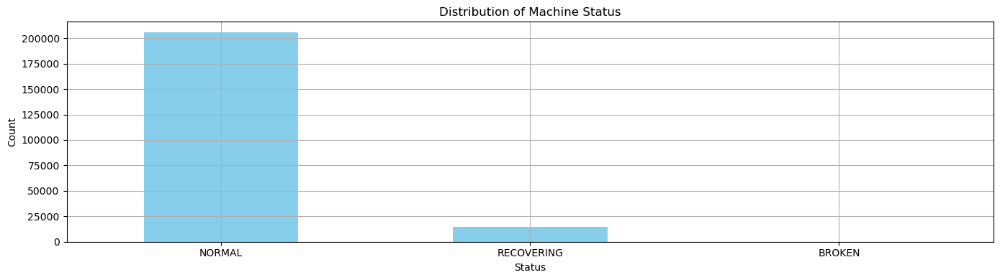

In [17]:
plt.figure(figsize=(14, 4))
df['machine_status'].value_counts().plot(kind='bar', color='skyblue')
plt.title("Distribution of Machine Status")
plt.xlabel("Status")
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.grid(True)
plt.tight_layout()

# Feature Engineering

### Rolling Mean and Std (Local Trends) These help detect subtle drifts or fluctuations.

In [18]:
sensor_cols = [col for col in df.columns if col.startswith('sensor_')]

In [19]:
window = 5  # 5-minute rolling window
for col in sensor_cols:
    df[f'{col}_mean'] = df[col].rolling(window=window).mean()
    df[f'{col}_std'] = df[col].rolling(window=window).std()

### Differences (Rate of Change) Shows how quickly a sensor value is changing

In [20]:
for col in sensor_cols:
    df[f'{col}_diff'] = df[col].diff()

### Lag Features- Use previous values as predictors

In [21]:
for col in sensor_cols:
    df[f'{col}_lag1'] = df[col].shift(1)

In [22]:
sensor_cols = [col for col in df.columns if col.startswith('sensor_')]

In [23]:
df_fe = df.dropna().copy()

from sklearn.preprocessing import StandardScaler
import pandas as pd

# Select only numeric columns (exclude datetime and other non-numeric types)
numeric_cols = df.select_dtypes(include=['number']).columns

# Initialize scaler
scaler = StandardScaler()

# Scale numeric columns and create a new DataFrame with scaled values
df_scaled = pd.DataFrame(scaler.fit_transform(df[numeric_cols]), 
                        columns=numeric_cols, 
                        index=df.index)

# If you want to keep non-numeric columns in the result:
df_final = df.copy()  # Start with original
df_final[numeric_cols] = df_scaled  # Replace numeric columns with scaled values

df_scaled.head()

df_scaled.dropna(inplace=True)

df_scaled.head()

In [24]:
# Handle missing values (if any)
df.fillna(df.mean(numeric_only=True), inplace=True)

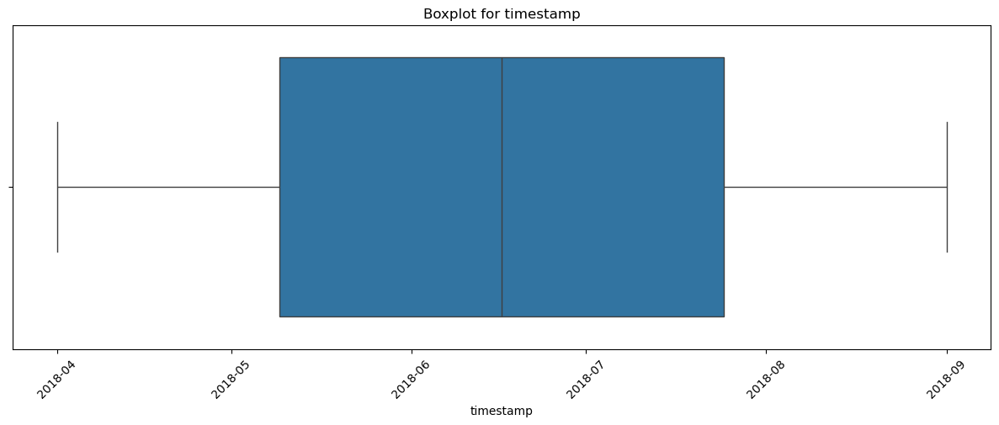

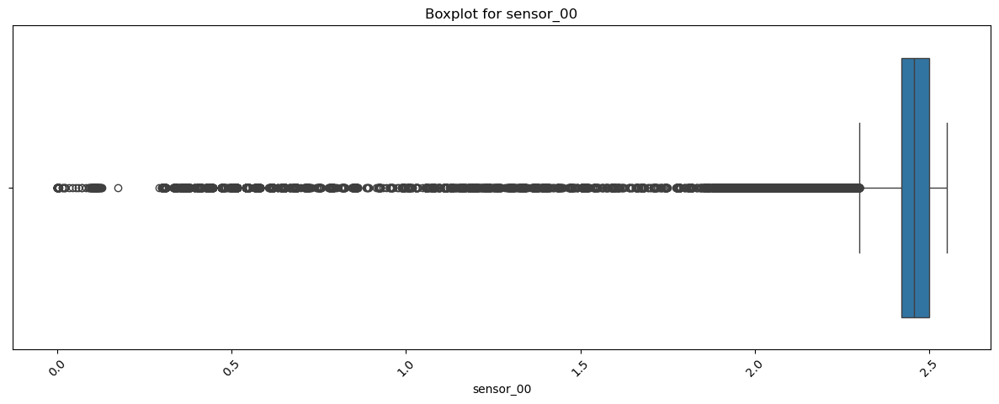

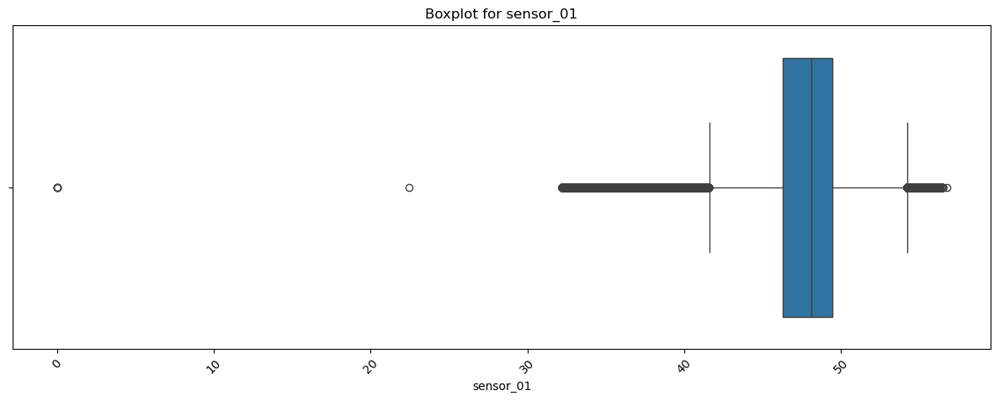

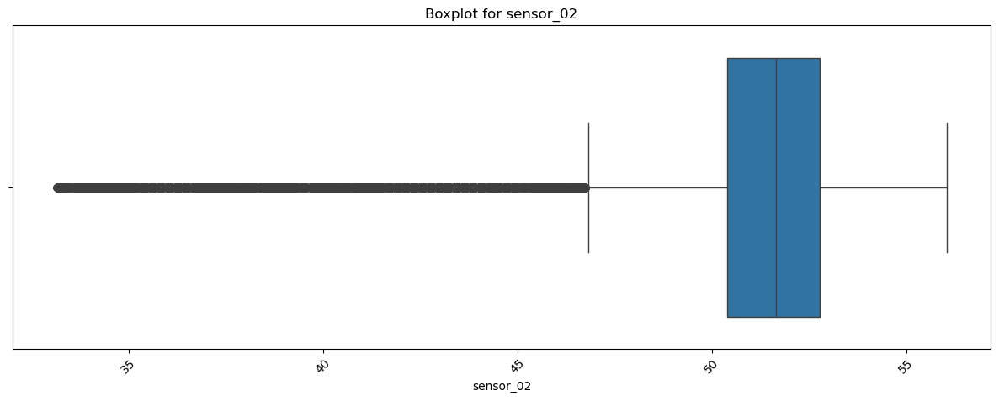

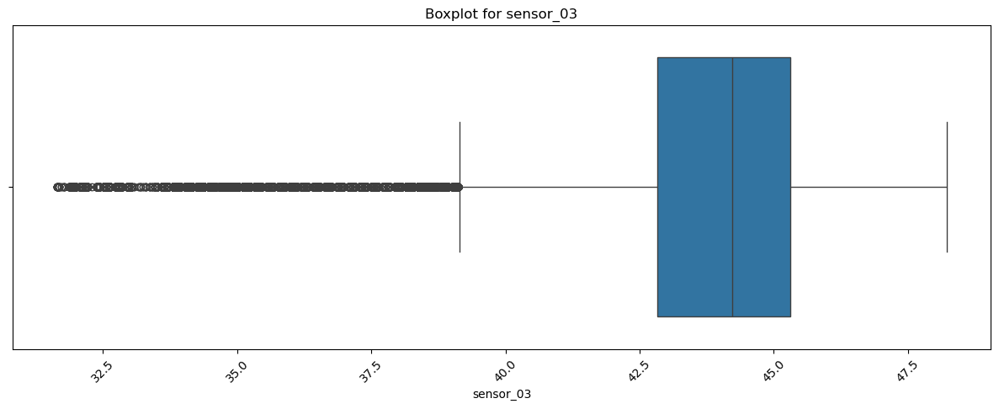

...

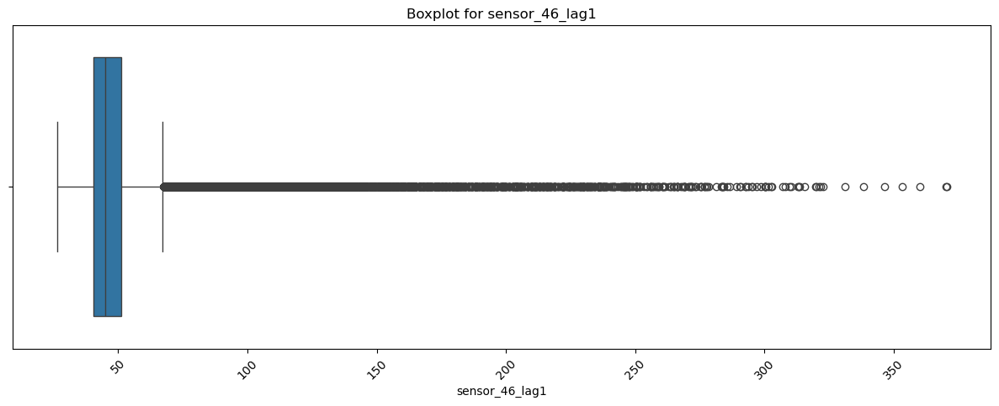

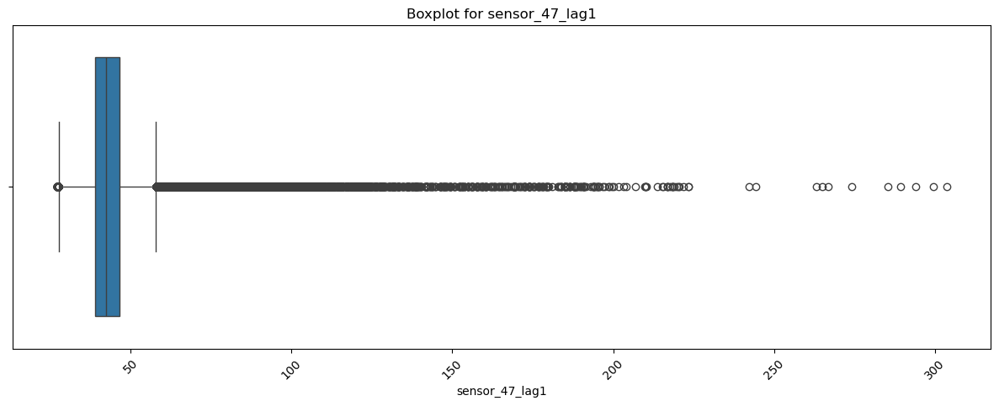

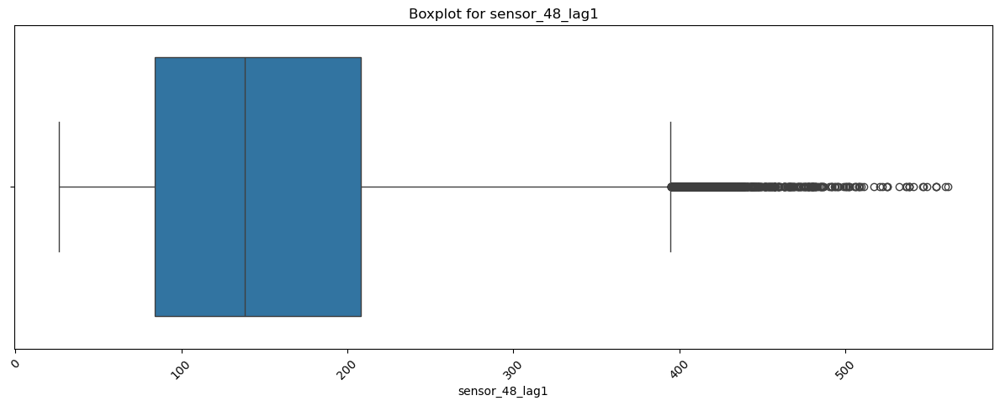

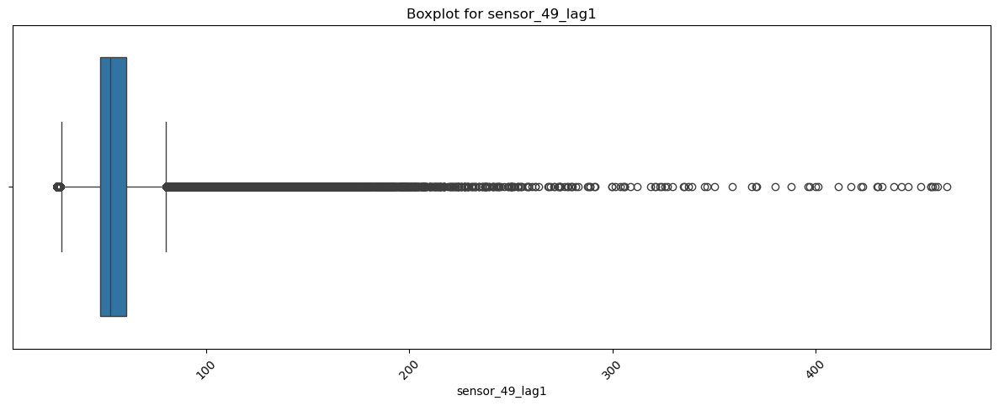

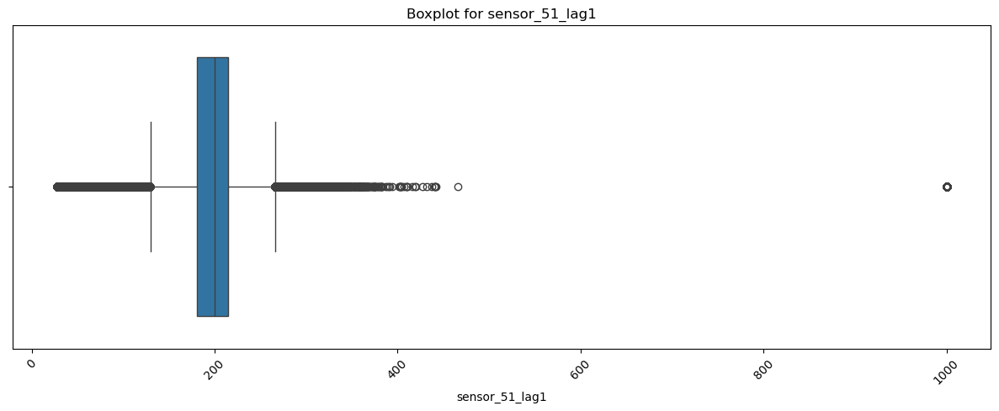

In [25]:
for column in df.columns:
    plt.figure(figsize=(15,5))
    sns.boxplot(x=df[column])
    plt.title(f"Boxplot for {column}")
    plt.xticks(rotation=45)
    plt.show()

In [26]:
#outlier Detection
def outlier_Detection(df,columns):
    for col in columns:
        Q1=df[col].quantile(0.25)
        Q3=df[col].quantile(0.75)
        iqr=Q3-Q1
        lower=Q1-1.5*iqr
        upper=Q3+1.5*iqr
        df[col]=np.where(df[col]>upper,upper,np.where(df[col]<lower,lower,df[col]))
    return df        

In [27]:
df = outlier_Detection(df, sensor_cols)

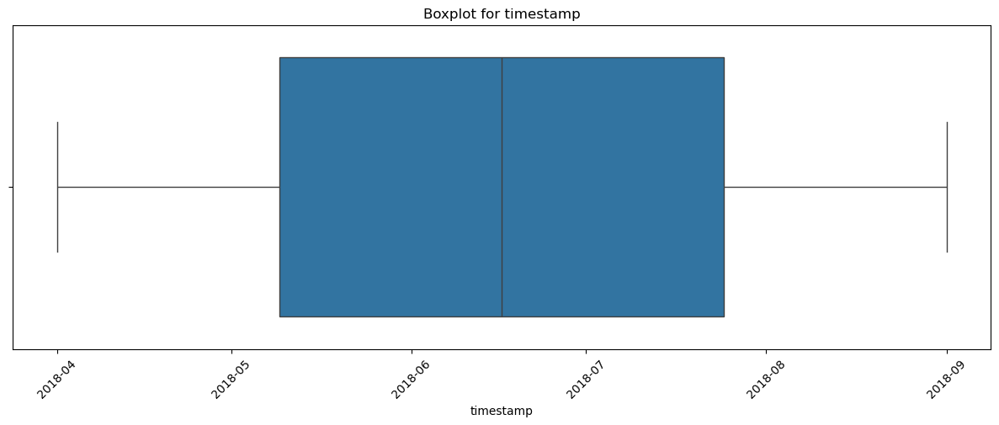

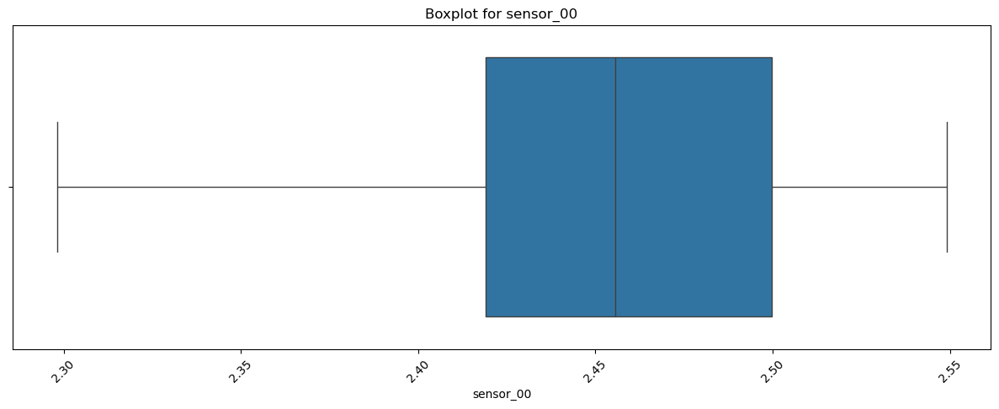

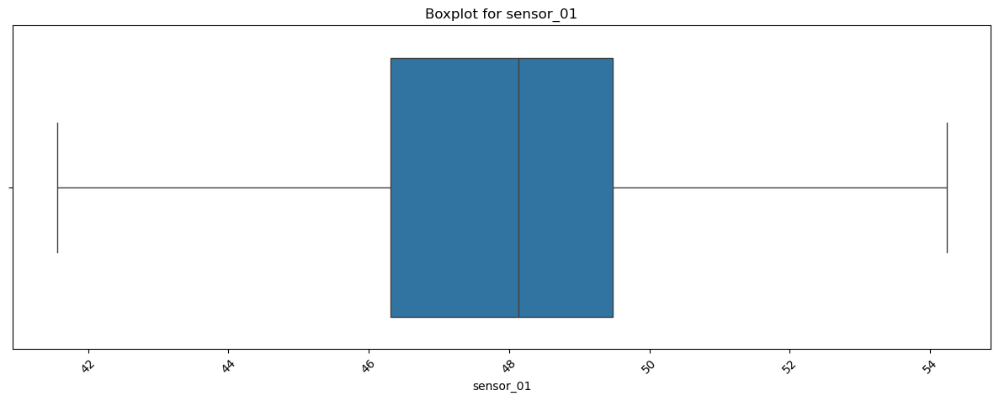

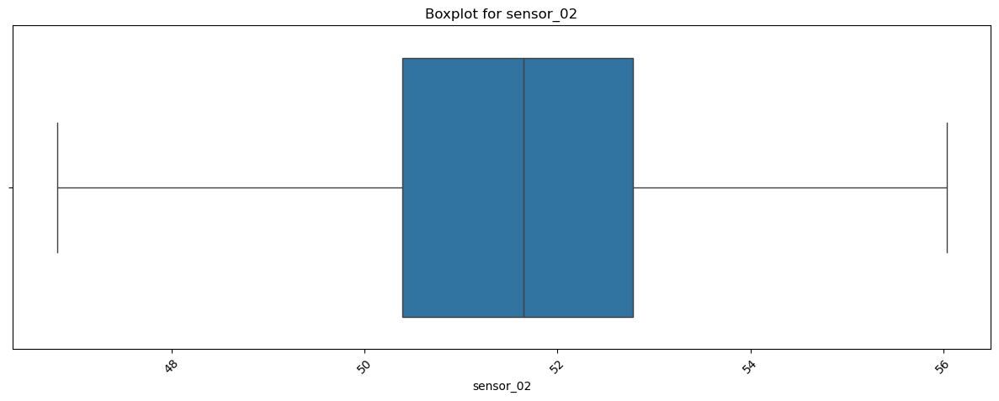

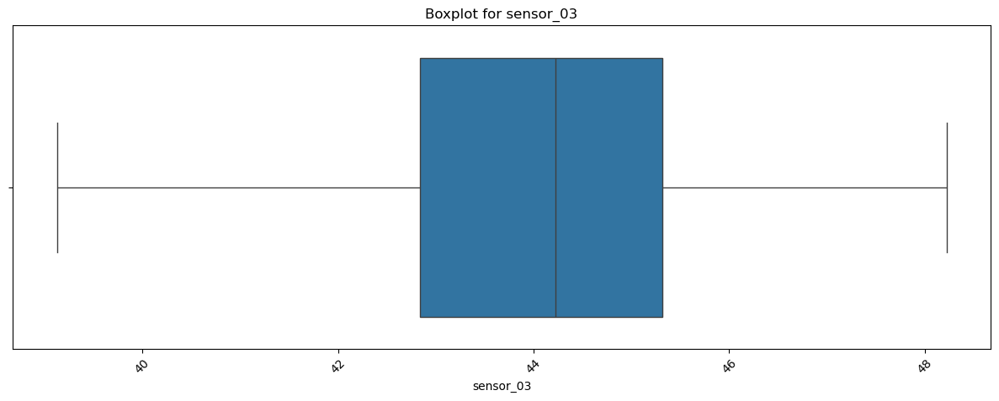

...

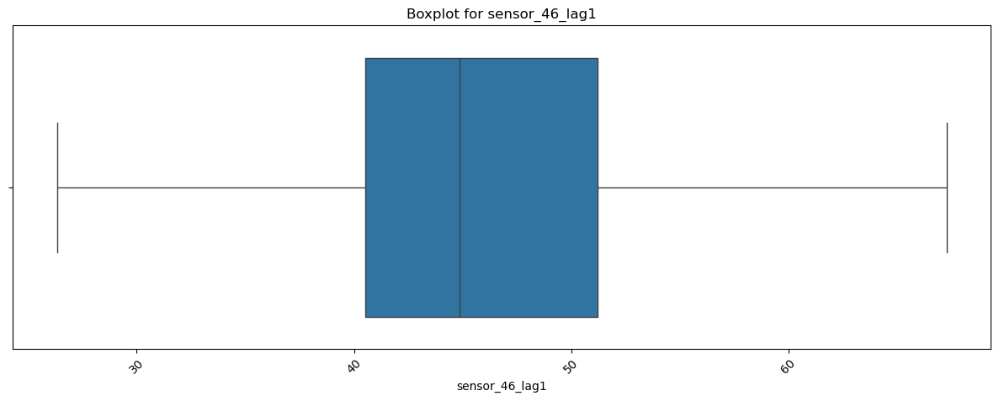

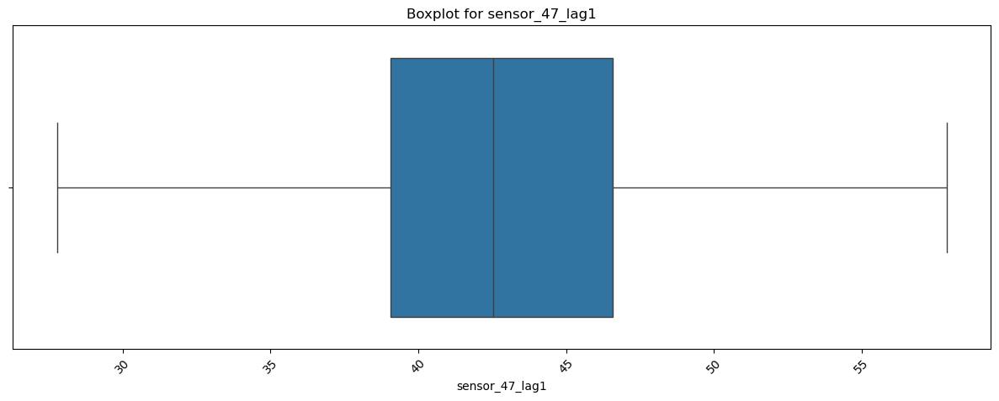

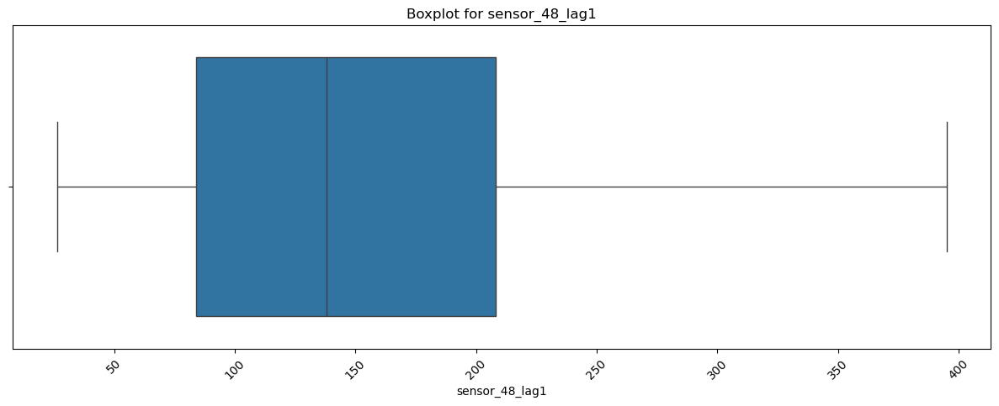

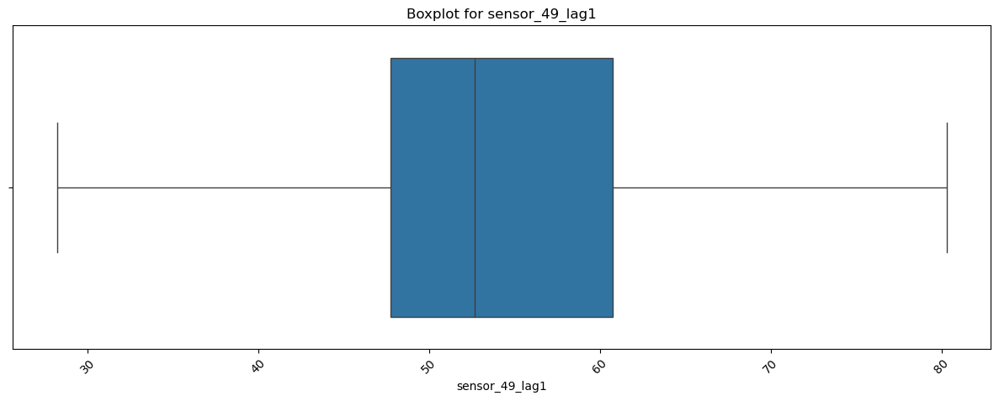

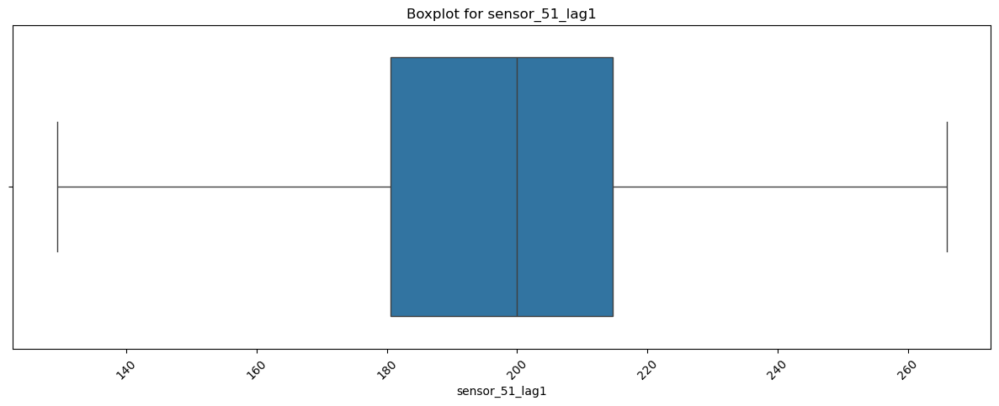

In [28]:
# After Outlier Detection
for column in df.columns:
    plt.figure(figsize=(15,5))
    sns.boxplot(x=df[column])
    plt.title(f"Boxplot for {column}")
    plt.xticks(rotation=45)
    plt.show()

## Data Preprocessing

In [29]:
# Encode target variable if it's categorical
if df['machine_status'].dtype == 'object':
    le = LabelEncoder()
    df['machine_status'] = le.fit_transform(df['machine_status'])

In [30]:
# Prepare features and target
x = df.drop(columns=['machine_status', 'timestamp'])
y = df['machine_status']

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

In [32]:
from sklearn.feature_selection import SelectKBest, f_classif

In [33]:
# Select top 10 features using ANOVA F-test
selector = SelectKBest(score_func=f_classif, k=10)
x_selected = selector.fit_transform(x_scaled, y)

## Train-Test Split

In [34]:
x_train, x_test, y_train, y_test = train_test_split(x_selected, y, test_size=0.2, random_state=42, stratify=y)

## Model Training and Evaluation

In [36]:
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold

In [38]:
models = {
    'Logistic Regression': LogisticRegression(C=1.0, penalty='l2', solver='liblinear'),
    'SVM': SVC(C=1.0, kernel='rbf'),
    'Random Forest': RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', max_depth=5)
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for name, model in models.items():
    print(f"\n{name}")
    model.fit(x_train, y_train)

    # Predictions
    train_pred = model.predict(x_train)
    test_pred = model.predict(x_test)

    # Scores
    print("Training Accuracy:", accuracy_score(y_train, train_pred))
    print("Test Accuracy:", accuracy_score(y_test, test_pred))
    print("Cross-Validation Accuracy (5-fold):", cross_val_score(model, x_selected, y, cv=cv).mean())
    print("Test Classification Report:")
    print(classification_report(y_test, test_pred))



Logistic Regression
Training Accuracy: 0.9858047385620915
Test Accuracy: 0.9855891430646333
Cross-Validation Accuracy (5-fold): 0.9857389251997095
Test Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      0.99      0.99     41167
           2       0.83      0.98      0.90      2895

    accuracy                           0.99     44064
   macro avg       0.61      0.65      0.63     44064
weighted avg       0.99      0.99      0.99     44064


SVM
Training Accuracy: 0.9874103576615831
Test Accuracy: 0.987041575889615
Cross-Validation Accuracy (5-fold): 0.9872140522875817
Test Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      0.99      0.99     41167
           2       0.84      1.00      0.91      2895

    accuracy                           0.99     44064
   macro avg

## Save Best Model

In [41]:
import joblib
import pickle

In [42]:
best_model =RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
best_model.fit(x_train, y_train) 
# Save the trained model to a .pkl file
with open("best_model.pkl", "wb") as file:
    pickle.dump(best_model, file)

print("The trained RandomForestClassifier model has been saved successfully!")

The trained RandomForestClassifier model has been saved successfully!


In [43]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

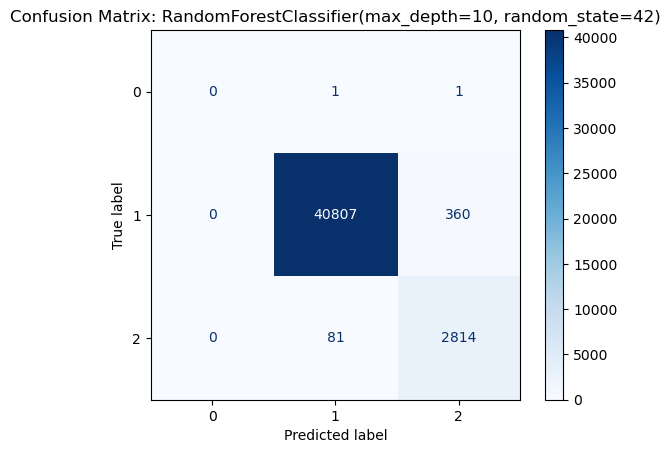

In [45]:
# Visualize Confusion Matrix for Best Model
y_pred = best_model.predict(x_test)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title(f"Confusion Matrix: {best_model}")
plt.show()

In [46]:
from sklearn.feature_selection import SelectKBest, f_classif
import joblib

# Assuming X_train and y_train already exist
selector = SelectKBest(score_func=f_classif, k=10)
x_selected = selector.fit_transform(x_scaled, y)

# Save selector
joblib.dump(selector, 'selector.pkl')

['selector.pkl']

In [48]:
from sklearn.preprocessing import StandardScaler
import joblib

# Assuming X_train exists (before feature selection)
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)

# Save the fitted scaler
joblib.dump(scaler, 'scaler.pkl')

['scaler.pkl']